In [1]:
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
from ast import literal_eval
import seaborn as sns
import numpy as np
import subprocess
from datetime import datetime
import time
import os

In [2]:
# 904580_ml.csv
# 904378_ml.csv
in_path = './../../data/lrzip/measurements_ml.csv'

In [3]:
df = pd.read_csv(in_path, index_col=0 )
df

,machine,jobID,taskID,component,method,t_delta,energy
0,curie01,904580,1,CPU_1_12V,CrcUpdate,0.004004,0.038134
1,curie01,904580,1,CPU_1_12V,[unknown],5.129954,38.662968
2,curie01,904580,1,CPU_1_12V,__clone,0.040051,0.375295
3,curie01,904580,1,CPU_1_12V,__mmap,0.007635,0.073548
4,curie01,904580,1,CPU_1_12V,__munmap,0.005397,0.049116
...,...,...,...,...,...,...,...
132183,curie01,904580,99,SSD_YELLOW_12V,sliding_get_sb,1.834432,0.033786
132184,curie01,904580,99,SSD_YELLOW_12V,sliding_get_sb_range,0.000311,0.000001
132185,curie01,904580,99,SSD_YELLOW_12V,sliding_match_len,0.018591,0.000266
132186,curie01,904580,99,SSD_YELLOW_12V,sliding_next_tag,3.594896,0.057199


In [4]:
print(len(df.method.unique()))
df_lrzip = df[['taskID', 'method', 't_delta', 'energy']].groupby(['taskID', 'method'])['t_delta', 'energy'].sum().reset_index()
print(len(df_lrzip.method.unique()))
df_lrzip

230
230


/tmp/ipykernel_16451/2024916768.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_lrzip = df[['taskID', 'method', 't_delta', 'energy']].groupby(['taskID', 'method'])['t_delta', 'energy'].sum().reset_index()


,taskID,method,t_delta,energy
0,1,CrcUpdate,0.056059,0.098131
1,1,[unknown],71.819351,105.039495
2,1,__clone,0.560717,0.968319
3,1,__mmap,0.106885,0.190069
4,1,__munmap,0.075559,0.128074
...,...,...,...,...
9437,200,sliding_get_sb,25.305693,44.088004
9438,200,sliding_match_len,0.673597,1.056205
9439,200,sliding_mcpy,0.010207,0.018472
9440,200,sliding_next_tag,45.635210,80.059374


In [5]:
cfg_file = './../../data/lrzip/lrzip_prof_configurations_rnd200.cfg'
# ['perf', 'record', '-e', 'probe_artificial:artif_*', '-e', 'cpu-clock', '-F', '1007', '-g', '-o', '/tmp/mweber/performance/perf.data', '--', './systems/x264/x264', 
#  '--no-8x8dct', '--no-cabac', '--no-deblock', '--no-mbtree', '--rc-lookahead', '10', '--ref', '8', '--threads', '2', 
#  '-o', '/tmp/mweber/experiment/output/out.264', './systems/x264/sintel_trailer_2k_480p24.y4m']

# option wise '--no-8x8dct', '--no-cabac', '--no-deblock', '--no-mbtree', '--no-fast-pskip', '--no-mixed-refs'
# alt         '--rc-lookahead 0', '--rc-lookahead 10', '--rc-lookahead 40', '--rc-lookahead 160'
# alt         '--ref 1', '--ref 2', '--ref 4', '--ref 8', '--ref 16'
# alt         '--threads 1', '--threads 2', '--threads 4', '--threads 8'


def extract_cfg(row_idx, lines):
    
    # lrzip_binary_options = ['--encrypt=secret', '-U', '-T']# 8
    # one_of_compression = ['--lzma', '-b', '-g', '-l', '-n', '-z']# 8 * 6 = 48
    # one_of_level = ['-L 1', '-L 2', '-L 3', '-L 4', '-L 5', '-L 6', '-L 7', '-L 8', '-L 9']# 48 * 9 = 432
    # one_of_cores = ['-p 1', '-p 2', '-p 3', '-p 4']# 432 * 4 = 1728
    # one_of_ram = ['-m 2', '-m 6', '-m 18']# 1728 * 3 = 5184
    
    # no gzip in 200 configurations
    
    curr_line = lines[int(row_idx)-1]
    curr_params = curr_line.split()
    
    encrypt = 1 if '--encrypt=secret' in curr_line else 0
    wind_size_unl = 1 if '-U' in curr_line else 0
    threshold = 1 if '-T' in curr_line else 0
    
    comp = ''
    if '--lzma' in curr_line:
        comp = 'lzma'
    elif '-b' in curr_line:
        comp = 'bzip2'
    elif '-g' in curr_line:
        comp = 'gzip'
    elif '-l' in curr_line:
        comp = 'lzo'
    elif '-n' in curr_line:
        comp = 'no_compress'
    else:
        comp = 'zpaq'
    
    level = curr_params[curr_params.index('-L')+1]
    cores = curr_params[curr_params.index('-p')+1]
    ram = curr_params[curr_params.index('-m')+1]
    
    return [int(cores), int(ram), int(level), encrypt, wind_size_unl, threshold, comp]

lines = [line.strip() for line in open(cfg_file)]

dfs_coll = []

for index, row in df_lrzip.iterrows():
    out = extract_cfg(row['taskID'], lines)
    dfs_coll.append([row.taskID, row.method, row.t_delta, row.energy] + out)
    
df_lrzip_opt = pd.DataFrame(dfs_coll, columns=['taskID', 'method', 'time', 'energy', 'cores', 'ram', 'level', 'encrypt', 'wind_size_unl', 'threshold', 'compression'])
df_lrzip_opt

,taskID,method,time,energy,cores,ram,level,encrypt,wind_size_unl,threshold,compression
0,1,CrcUpdate,0.056059,0.098131,2,6,7,1,1,1,gzip
1,1,[unknown],71.819351,105.039495,2,6,7,1,1,1,gzip
2,1,__clone,0.560717,0.968319,2,6,7,1,1,1,gzip
3,1,__mmap,0.106885,0.190069,2,6,7,1,1,1,gzip
4,1,__munmap,0.075559,0.128074,2,6,7,1,1,1,gzip
...,...,...,...,...,...,...,...,...,...,...,...
9437,200,sliding_get_sb,25.305693,44.088004,2,6,7,1,1,1,gzip
9438,200,sliding_match_len,0.673597,1.056205,2,6,7,1,1,1,gzip
9439,200,sliding_mcpy,0.010207,0.018472,2,6,7,1,1,1,gzip
9440,200,sliding_next_tag,45.635210,80.059374,2,6,7,1,1,1,gzip


In [6]:
def get_method_share(row, total_time):
    return row['time']*100/total_time
out_arr = []
for key, tmp_grp in df_lrzip_opt.groupby(['taskID']):
    cfg_perf = np.sum(tmp_grp['time'])
    num_methods = len(tmp_grp)
    #print(key)
    tmp_grp = tmp_grp.reset_index(drop=True)
    tmp_grp['time frac cfg'] = tmp_grp.apply(get_method_share, total_time=cfg_perf, axis=1)
    out_arr.append(tmp_grp)

df_lrzip_opt = pd.concat(out_arr)
df_lrzip_opt

,taskID,method,time,energy,cores,ram,level,encrypt,wind_size_unl,threshold,compression,time frac cfg
0,1,CrcUpdate,0.056059,0.098131,2,6,7,1,1,1,gzip,0.013205
1,1,[unknown],71.819351,105.039495,2,6,7,1,1,1,gzip,16.917594
2,1,__clone,0.560717,0.968319,2,6,7,1,1,1,gzip,0.132081
3,1,__mmap,0.106885,0.190069,2,6,7,1,1,1,gzip,0.025178
4,1,__munmap,0.075559,0.128074,2,6,7,1,1,1,gzip,0.017799
...,...,...,...,...,...,...,...,...,...,...,...,...
43,200,sliding_get_sb,25.305693,44.088004,2,6,7,1,1,1,gzip,4.260245
44,200,sliding_match_len,0.673597,1.056205,2,6,7,1,1,1,gzip,0.113401
45,200,sliding_mcpy,0.010207,0.018472,2,6,7,1,1,1,gzip,0.001718
46,200,sliding_next_tag,45.635210,80.059374,2,6,7,1,1,1,gzip,7.682745


BZ2_blockSort 0.20236063811116942 40 False


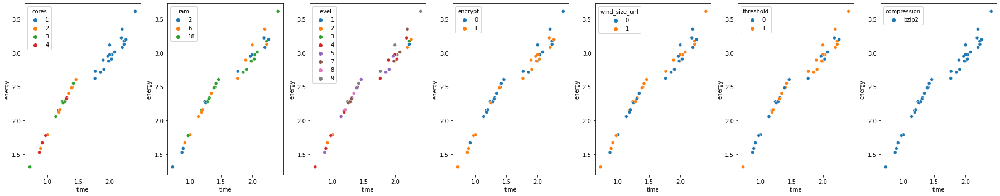

BZ2_compressBlock 29.185083279772602 40 False


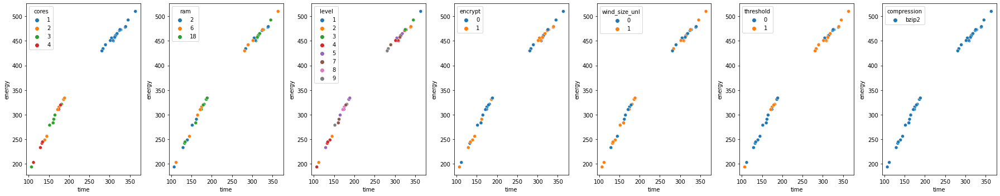

BZ2_hbMakeCodeLengths 1.0253255538392956 40 False


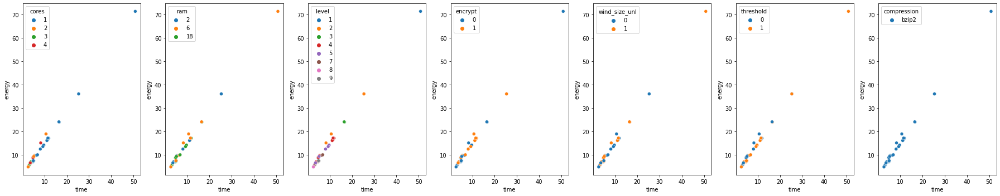

CrcUpdate 0.12670913983253757 183 False


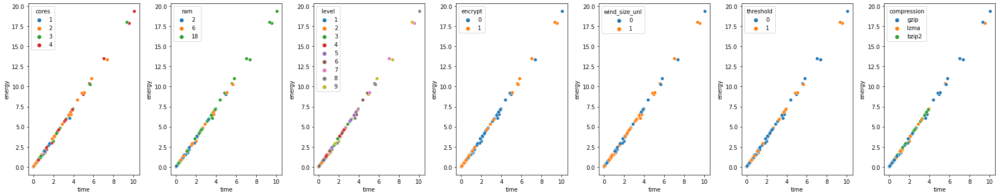

LenEnc_Encode 0.1434359901533304 31 False


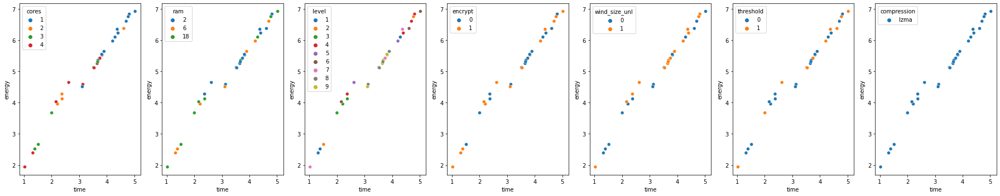

LenEnc_Encode2 0.14287480399499042 31 False


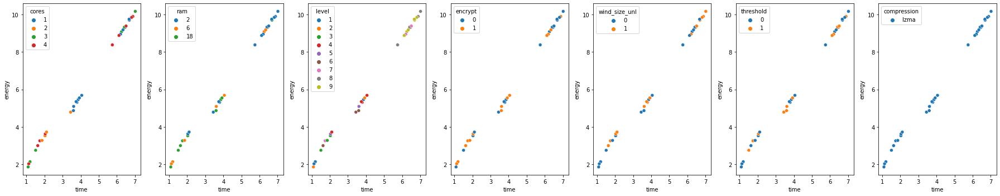

LitEnc_Encode 1.000947767677268 31 False


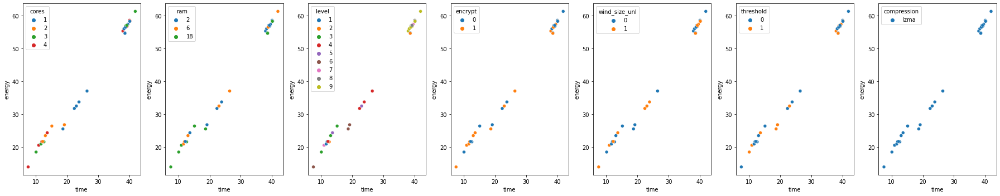

LitEnc_EncodeMatched 0.7887069616179452 31 False


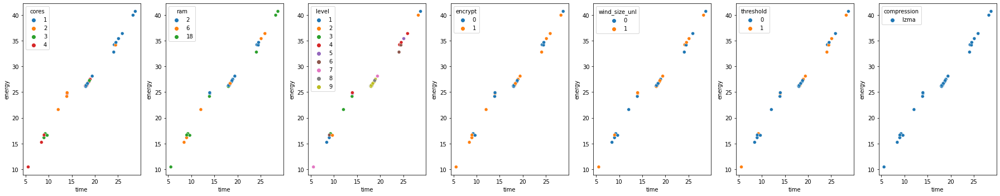

LzmaEnc_CodeOneBlock 2.7485909947185574 31 False


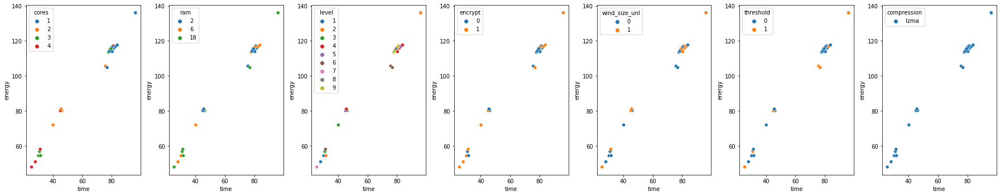

MatchFinder_GetNumAvailableBytes 0.5939215501886819 30 False


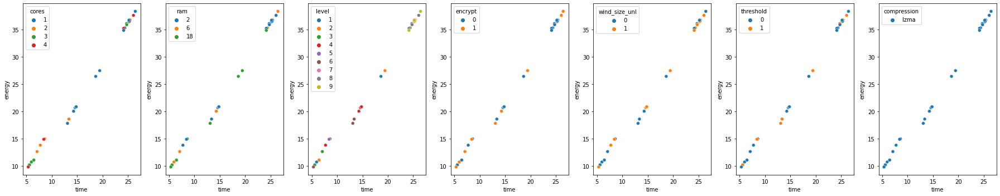

MatchFinder_GetPointerToCurrentPos 0.2722584874703484 30 False


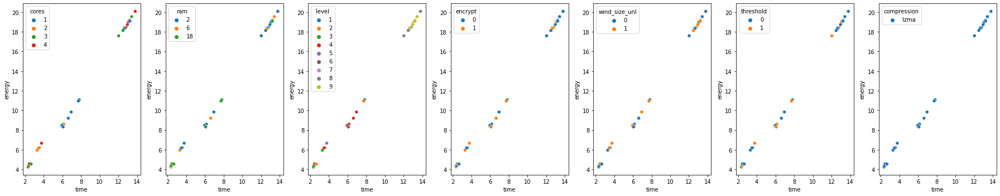

MatchFinder_Init 0.1983332828902985 31 False


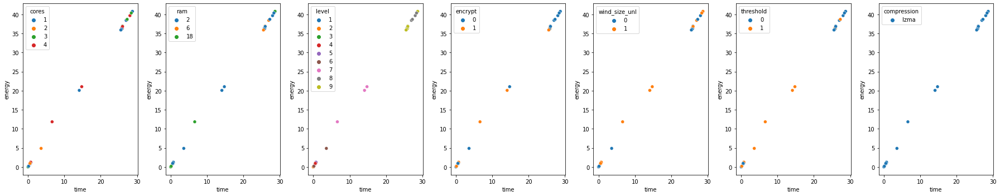

RangeEnc_EncodeBit 9.943222308597887 31 False


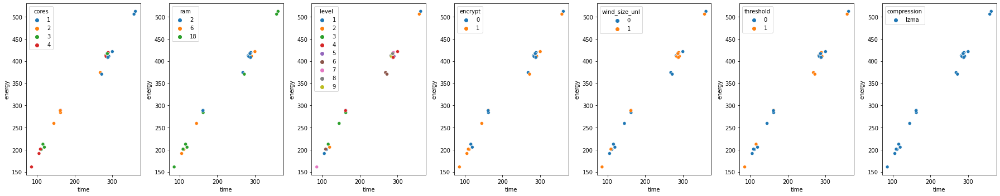

RangeEnc_EncodeDirectBits 1.1830767544660756 31 False


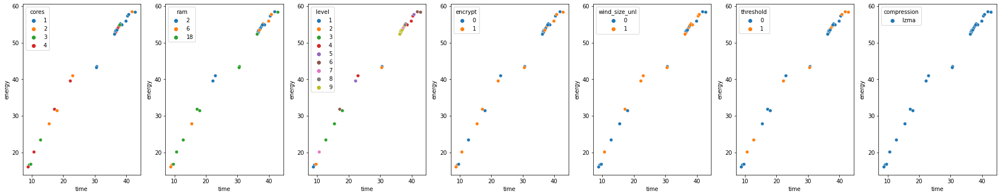

RangeEnc_ShiftLow 1.4766051131942968 31 False


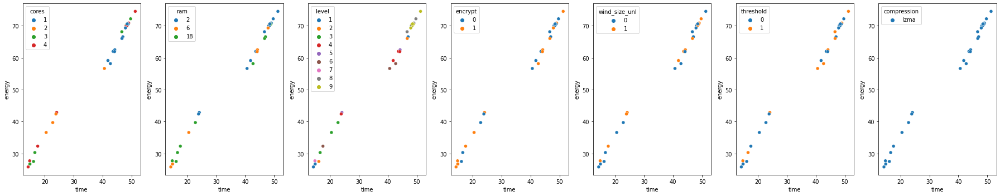

RcTree_Encode 1.0789673787750775 31 False


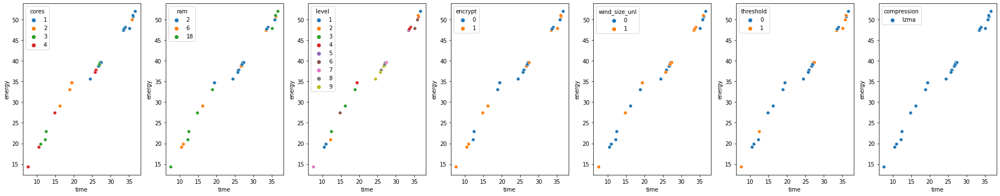

RcTree_ReverseEncode 0.623783372045968 31 False


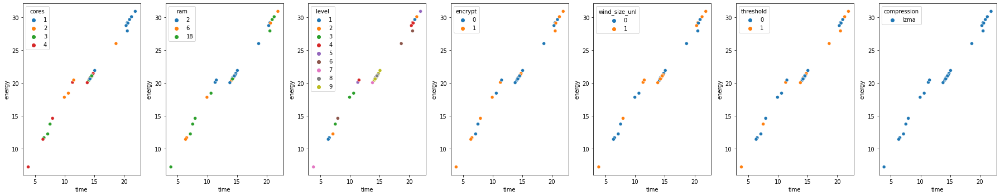

ReadMatchDistances 1.179964565722364 31 False


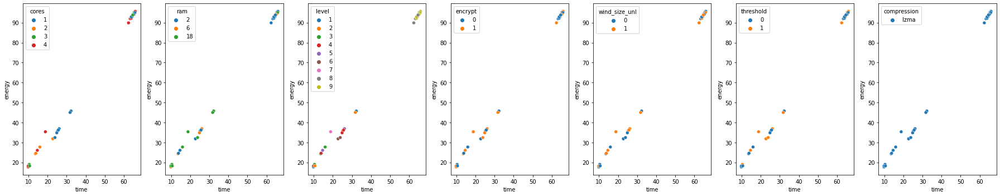

[unknown] 39.665774790639134 200 False


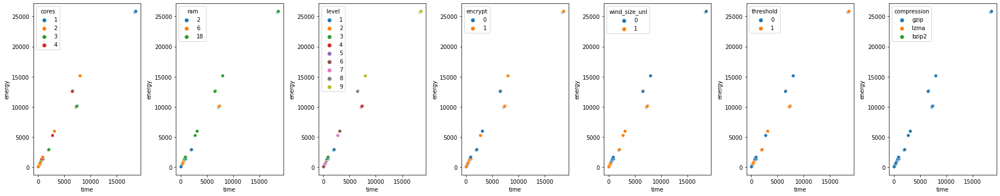

adler32_z 0.28156075762409183 25 False


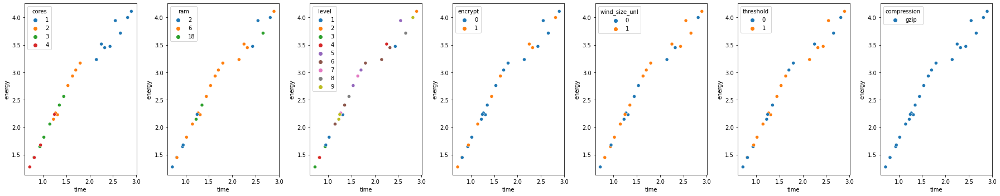

aes_crypt_cbc 1.6254898355538645 89 False


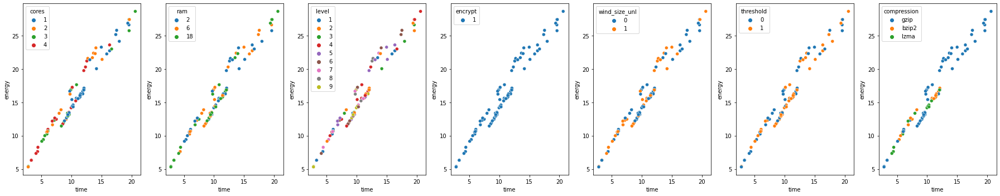

aes_crypt_ecb 4.866358027220348 89 False


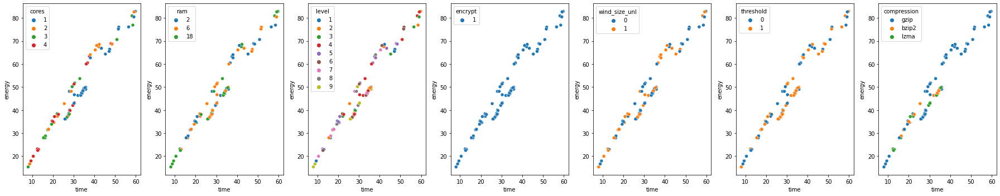

bufRead::get 0.29528603335017817 39 False


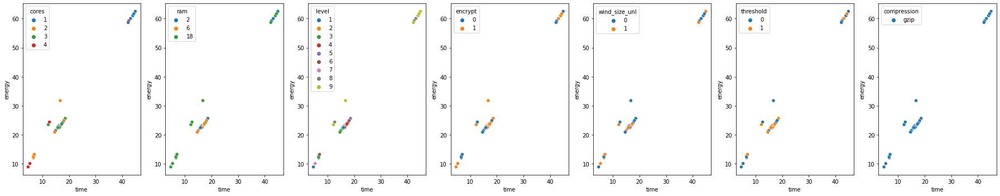

clean_one_from_hash 0.15496540499214398 200 False


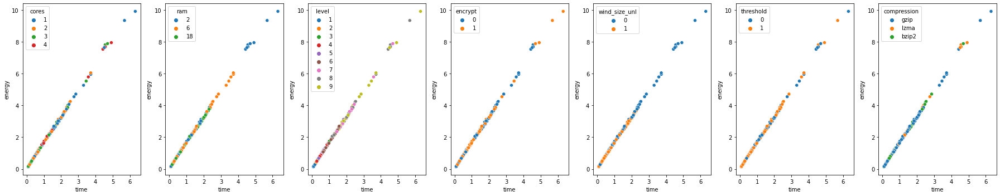

empty_hash 5.728170526973909 200 False


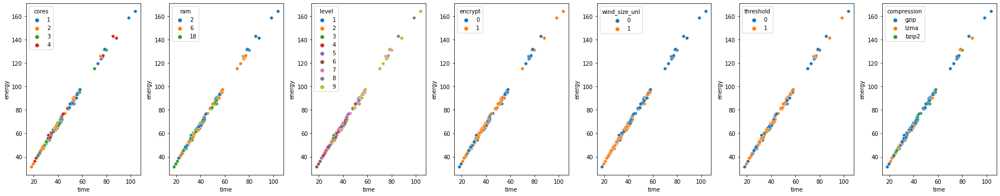

ffsll 0.5336513816057762 200 False


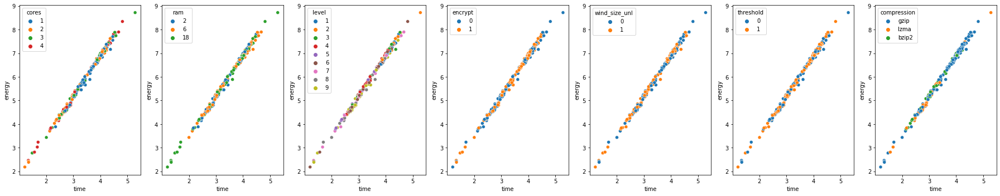

find_best_match 2.2013192077508053 200 False


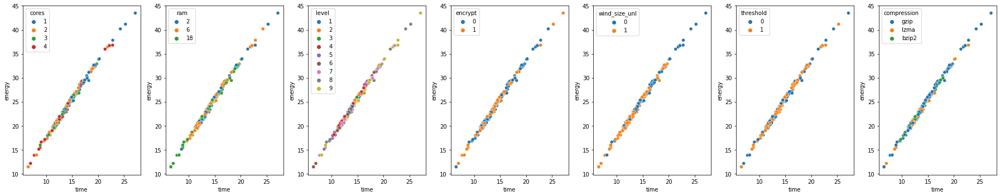

hash_search 3.978720137621924 200 False


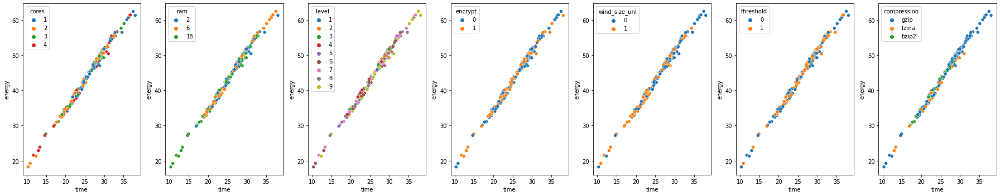

increase_mask 0.32366748282966573 200 False


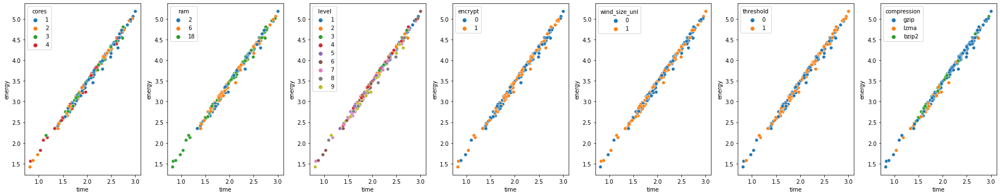

insert_hash 2.30702179042112 200 False


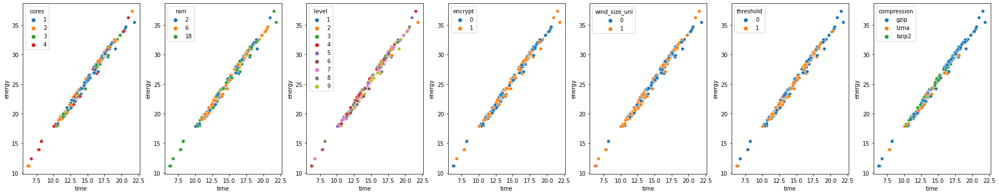

lesser_bitness 1.1289240320359701 200 False


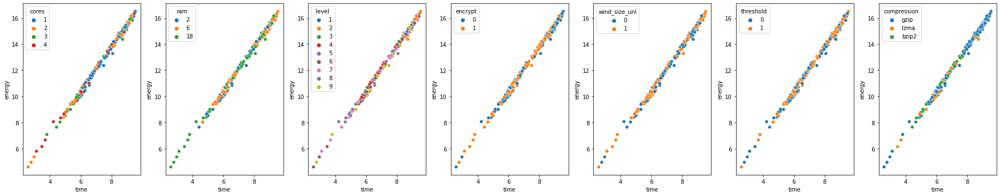

libzpaq::Encoder::compress 1.7327393310051185 39 False


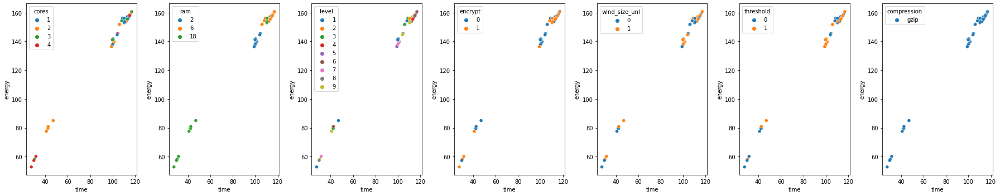

libzpaq::Encoder::encode 4.050669983677031 39 False


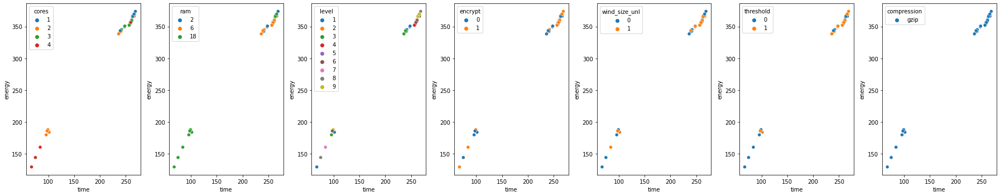

libzpaq::Predictor::predict 1.2780577036739027 39 False


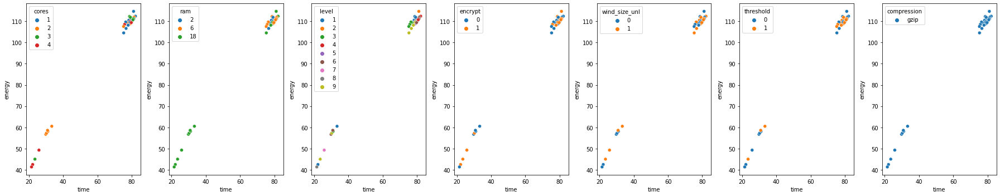

libzpaq::Predictor::update 2.911172239717131 39 False


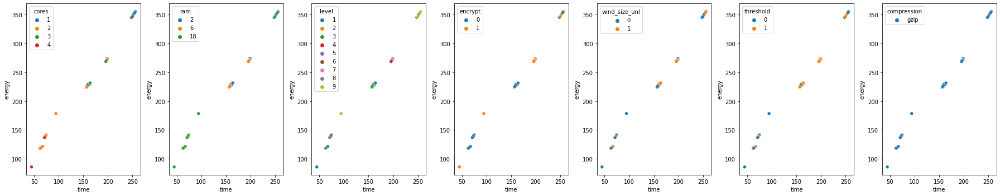

libzpaq::ZPAQL::run 0.24929236110978523 39 False


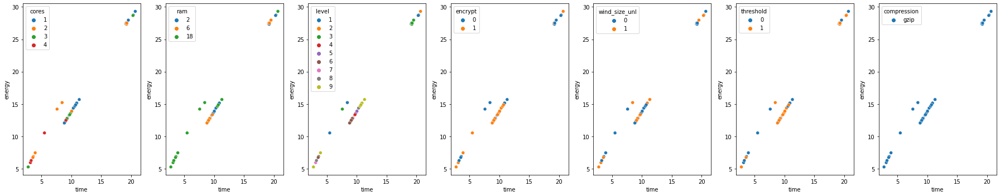

md5_process_block 0.10450219148185373 187 False


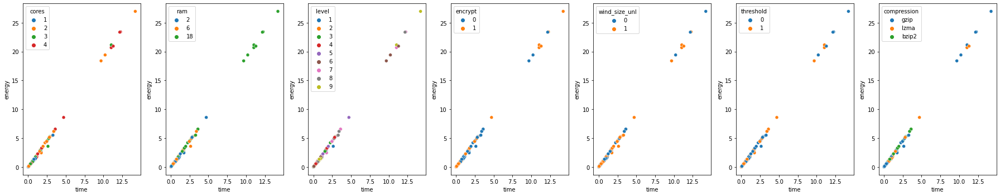

minimum_bitness 0.8448658903959503 200 False


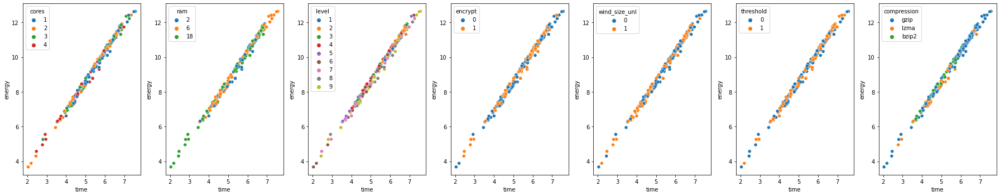

primary_hash 0.11928989102084725 200 False


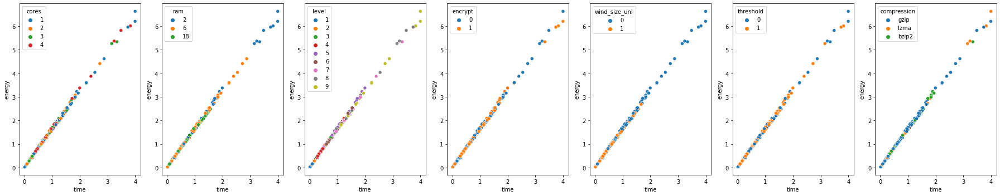

sha4_process 4.0603415332709405 89 False


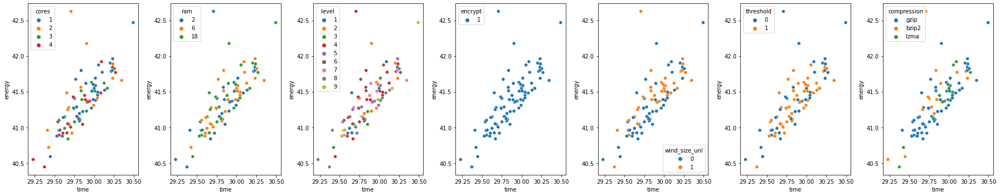

sha4_update 0.31218034665155536 89 False


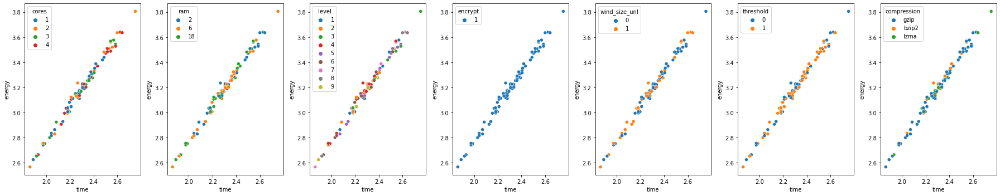

sliding_get_sb 5.5205840774269515 200 False


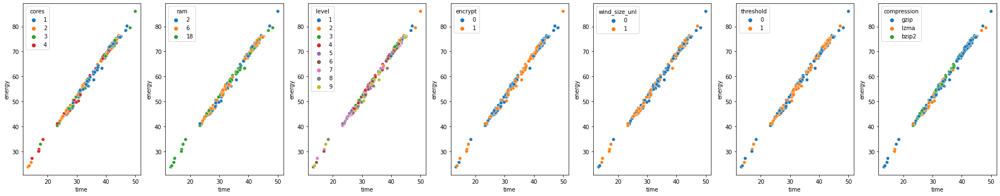

sliding_next_tag 10.68031549987315 200 False


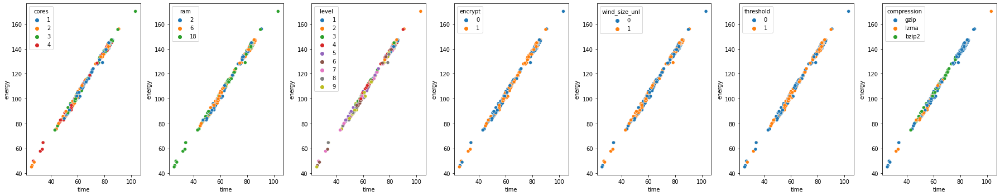

,taskID,method,time,energy,cores,ram,level,encrypt,wind_size_unl,threshold,compression,time frac cfg
0,3,BZ2_blockSort,2.030347,2.906806,1,18,4,1,0,0,bzip2,0.190124
0,4,BZ2_blockSort,1.135937,2.056267,3,6,5,0,0,0,bzip2,0.204391
0,5,BZ2_blockSort,1.238810,2.276920,3,2,9,0,1,0,bzip2,0.217045
0,12,BZ2_blockSort,2.186038,3.220730,1,2,4,1,0,0,bzip2,0.210010
0,13,BZ2_blockSort,2.036615,2.970473,1,18,9,0,1,1,bzip2,0.207411
...,...,...,...,...,...,...,...,...,...,...,...,...
46,196,sliding_next_tag,51.126023,89.759588,2,18,5,0,1,0,bzip2,8.615434
49,197,sliding_next_tag,55.247139,94.585427,4,6,6,1,1,1,gzip,0.666288
52,198,sliding_next_tag,58.374033,99.861766,3,6,4,1,1,1,gzip,0.705561
36,199,sliding_next_tag,77.217805,133.721244,2,2,6,1,1,0,gzip,20.057340


In [7]:
# filter unimportant methods
# distribution of energy consumptions of methods

all_methods = df_lrzip_opt.method.unique()
all_method_mean_perfs = []
skipped_methods = 0

influential_methods_arr = []

for method, method_df in df_lrzip_opt.groupby('method'):
    methods_mean_perf = method_df['time frac cfg'].mean()
    all_method_mean_perfs.append(methods_mean_perf)
    
    # filter value in percent
    filter_mean_value = 0.1
    if methods_mean_perf < filter_mean_value:
        #print(method, methods_mean_perf, methods_mean_perf < filter_mean_value)
        skipped_methods += 1
        continue
    elif len(method_df) < 20:
        skipped_methods += 1
        continue

        
    print(method, methods_mean_perf, len(method_df), methods_mean_perf < filter_mean_value)
    fig, axes = plt.subplots(nrows=1, ncols=7, figsize=(25, 5))

    # no gzip
    # 'cores', 'ram', 'level', 'encrypt', 'wind_size_unl', 'threshold', 'lzma', 'bzip2', 'gzip', 'lzo', 'no_compress', 'zpaq'

    sns.scatterplot(data=method_df, x='time', y='energy', palette="tab10", hue='cores',ax=axes[0])
    sns.scatterplot(data=method_df, x='time', y='energy', palette="tab10", hue='ram', ax=axes[1])
    sns.scatterplot(data=method_df, x='time', y='energy', palette="tab10", hue='level', ax=axes[2])
    sns.scatterplot(data=method_df, x='time', y='energy', palette="tab10", hue='encrypt', ax=axes[3])
    sns.scatterplot(data=method_df, x='time', y='energy', palette="tab10", hue='wind_size_unl', ax=axes[4])
    sns.scatterplot(data=method_df, x='time', y='energy', palette="tab10", hue='threshold', ax=axes[5])
    sns.scatterplot(data=method_df, x='time', y='energy', palette="tab10", hue='compression', ax=axes[6])

    fig.tight_layout()
    #plt.suptitle(method)
    plt.savefig('./../../RQ3/lrzip/scatter/'+method+'.pdf')
    plt.show()

    method_df['method'] = method
    influential_methods_arr.append(method_df)

influential_methods = pd.concat(influential_methods_arr)
influential_methods

In [8]:
all_person = []
for method, method_df in influential_methods.groupby(['method']):
    perfor = method_df['time'].to_numpy()
    energy = method_df['energy'].to_numpy()
    corr, p = stats.pearsonr(perfor, energy)
    all_person.append(corr)

    
print(np.mean(all_person))
all_person

0.9887653618773149


[0.9743572380455336,
 0.9935698691286092,
 0.9977893713051768,
 0.9991323780965092,
 0.9889240829084213,
 0.9965445918167963,
 0.995786685024958,
 0.9888832159994678,
 0.9942201321360778,
 0.9965678224030506,
 0.9976554399437788,
 0.9996562934141534,
 0.9941212234356019,
 0.9922842241752764,
 0.9945738799200188,
 0.9889209455021574,
 0.9874757355309216,
 0.9979955123639088,
 0.995692507862537,
 0.9818001633155005,
 0.974795261980214,
 0.9746639747459415,
 0.9909092427628158,
 0.9993311910332306,
 0.9988813335514605,
 0.9976326091784367,
 0.9974259970775602,
 0.9962167433590712,
 0.9972337409969207,
 0.9962843323208902,
 0.9977659572214961,
 0.9967777383332717,
 0.9981931216663219,
 0.9976075455611224,
 0.994616908428846,
 0.98974157924708,
 0.9992755477879559,
 0.9968368656545923,
 0.9992319272783031,
 0.7771250549978014,
 0.9948894833097097,
 0.9975475701950217,
 0.9979755217080147]

In [9]:
print('number methods skipped', skipped_methods)
print(len(all_method_mean_perfs), np.sum(all_method_mean_perfs))

number methods skipped 187
230 291.1727565038533


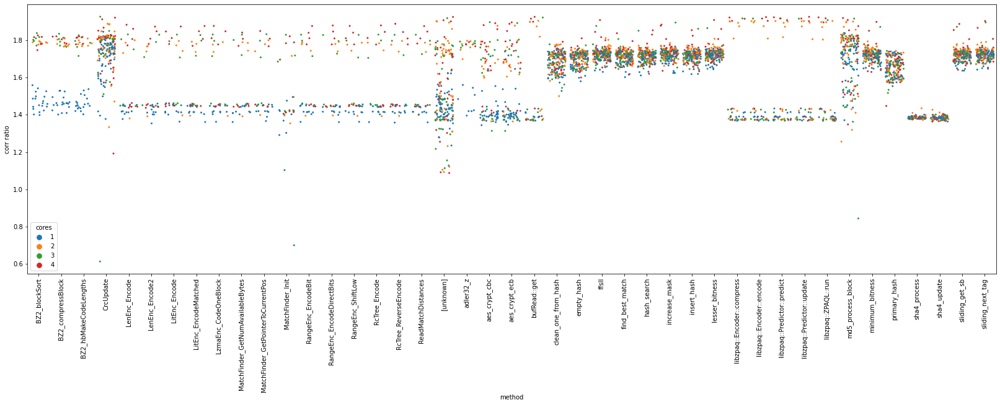

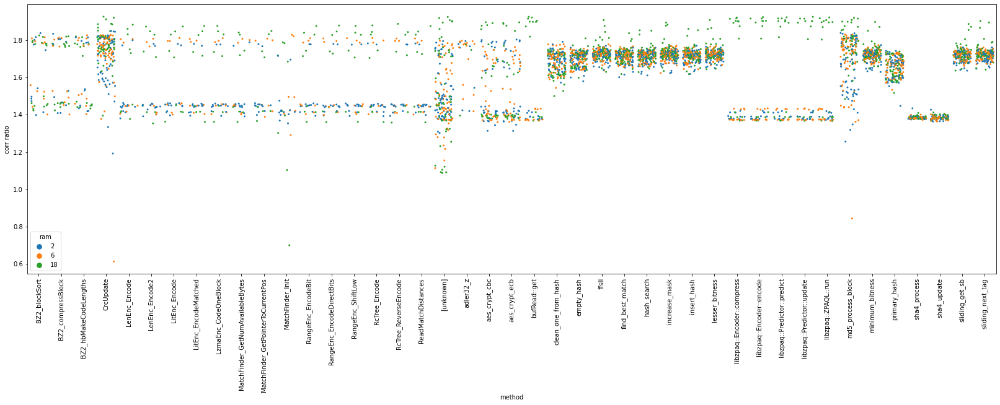

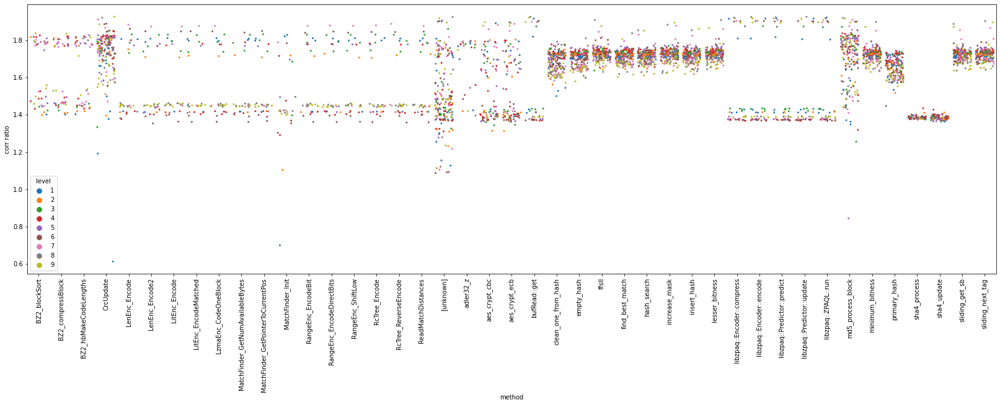

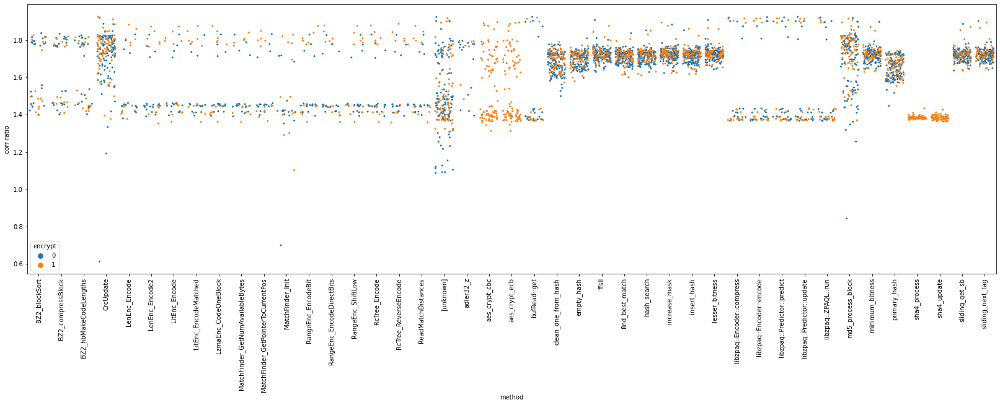

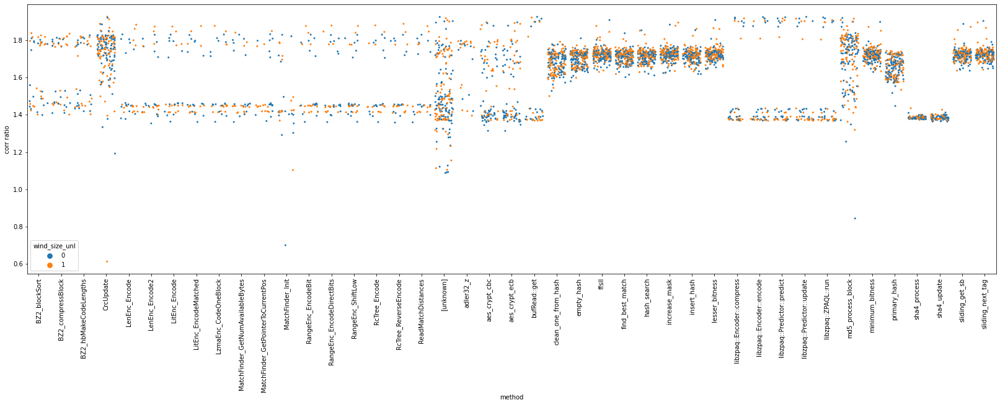

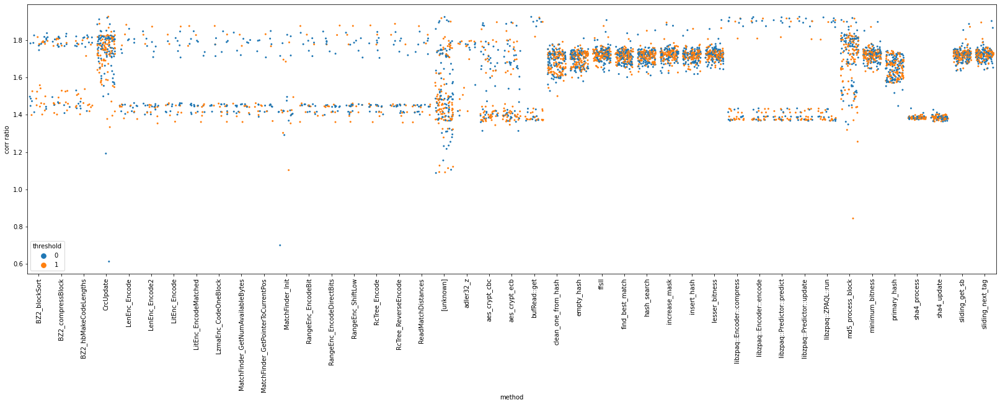

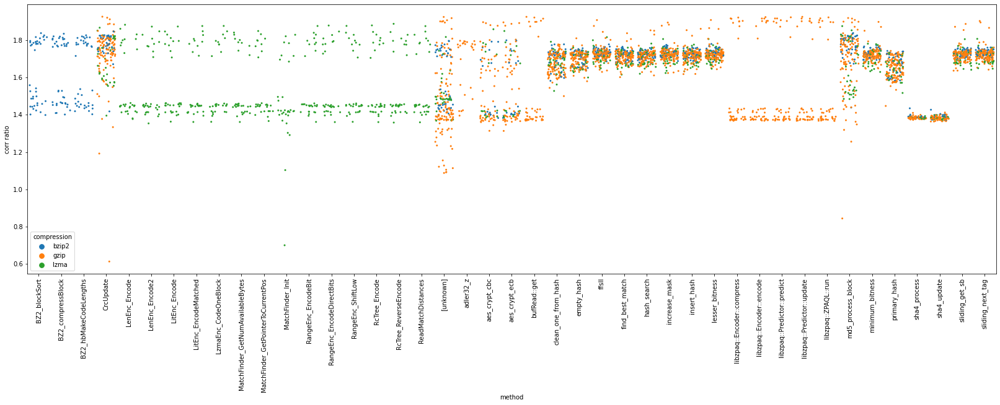

,taskID,method,time,energy,cores,ram,level,encrypt,wind_size_unl,threshold,compression,time frac cfg,corr ratio
0,3,BZ2_blockSort,2.030347,2.906806,1,18,4,1,0,0,bzip2,0.190124,1.431680
0,4,BZ2_blockSort,1.135937,2.056267,3,6,5,0,0,0,bzip2,0.204391,1.810194
0,5,BZ2_blockSort,1.238810,2.276920,3,2,9,0,1,0,bzip2,0.217045,1.837990
0,12,BZ2_blockSort,2.186038,3.220730,1,2,4,1,0,0,bzip2,0.210010,1.473318
0,13,BZ2_blockSort,2.036615,2.970473,1,18,9,0,1,1,bzip2,0.207411,1.458534
...,...,...,...,...,...,...,...,...,...,...,...,...,...
46,196,sliding_next_tag,51.126023,89.759588,2,18,5,0,1,0,bzip2,8.615434,1.755654
49,197,sliding_next_tag,55.247139,94.585427,4,6,6,1,1,1,gzip,0.666288,1.712042
52,198,sliding_next_tag,58.374033,99.861766,3,6,4,1,1,1,gzip,0.705561,1.710722
36,199,sliding_next_tag,77.217805,133.721244,2,2,6,1,1,0,gzip,20.057340,1.731741


In [10]:
influential_methods['corr ratio'] = influential_methods['energy']/influential_methods['time']

options = ['cores', 'ram', 'level', 'encrypt', 'wind_size_unl', 'threshold', 'compression']

methodssubset = ['get_ref', 'mb_analyse_intra', 'x264_8_macroblock_analyse', 'x264_8_macroblock_encode', 
                 'x264_pixel_sad_x3_8x8', 'x264_pixel_sad_x4_16x16', 'x264_pixel_sad_x4_8x8', 
                 'x264_pixel_satd_16x16']

for idx, opt in enumerate(options):
    plt.figure(figsize=(28,8))
    sns.stripplot(data=influential_methods, x="method", y="corr ratio", size=3, hue=opt, jitter=0.4)
    plt.xticks(rotation=90)
    plt.savefig('./../../RQ2/lrzip/'+opt+'_influential_methods_proxy_ratio.pdf')
    plt.show()

influential_methods

In [11]:
from unidip import UniDip
from scipy.stats import variation

In [12]:
def plot_corr_ratio_kde_lrzip(method_df, method):
    plt.figure(figsize=(5,3))
    sns.kdeplot(data=method_df, x='corr ratio')
    plt.savefig('./../../RQ2/lrzip/proxy_dist/'+method+'_proxy_ratio_dist.pdf')
    plt.show()
    
    fig, axes = plt.subplots(nrows=1, ncols=7, figsize=(25, 4))

    # no gzip
    # 'cores', 'ram', 'level', 'encrypt', 'wind_size_unl', 'threshold', 'lzma', 'bzip2', 'gzip', 'lzo', 'no_compress', 'zpaq'

    sns.kdeplot(data=method_df, x='corr ratio', palette="tab10", hue='cores',ax=axes[0])
    sns.kdeplot(data=method_df, x='corr ratio', palette="tab10", hue='ram', ax=axes[1])
    sns.kdeplot(data=method_df, x='corr ratio', palette="tab10", hue='level', ax=axes[2])
    sns.kdeplot(data=method_df, x='corr ratio', palette="tab10", hue='encrypt', ax=axes[3])
    sns.kdeplot(data=method_df, x='corr ratio', palette="tab10", hue='wind_size_unl', ax=axes[4])
    sns.kdeplot(data=method_df, x='corr ratio', palette="tab10", hue='threshold', ax=axes[5])
    sns.kdeplot(data=method_df, x='corr ratio', palette="tab10", hue='compression', ax=axes[6])

    fig.tight_layout()
    #plt.suptitle(method)
    plt.savefig('./../../RQ2/lrzip/proxy_dist/'+method+'_proxy_ratio_dist_feature.pdf')
    plt.show()
    

Number all methods: 230
BZ2_blockSort


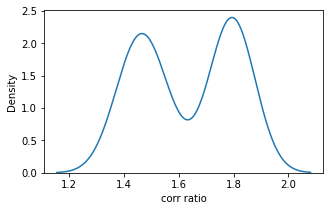

/home/mweber/tmp/FFEM x264/cluster/method-level-FAME-env/lib/python3.10/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


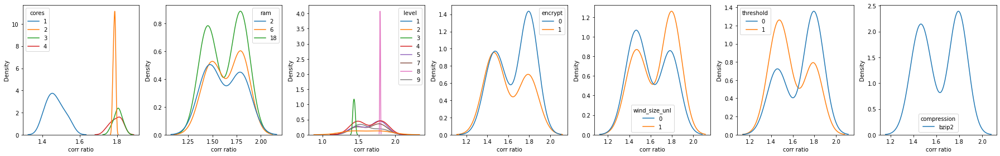

BZ2_compressBlock


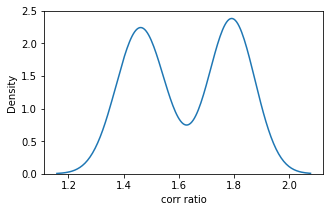

/home/mweber/tmp/FFEM x264/cluster/method-level-FAME-env/lib/python3.10/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


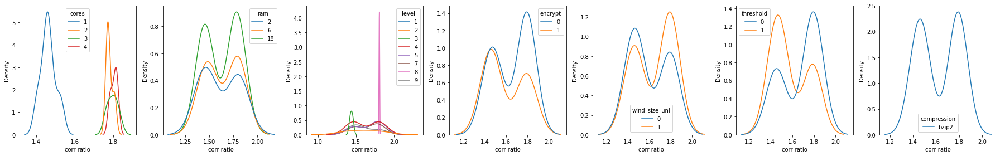

BZ2_hbMakeCodeLengths


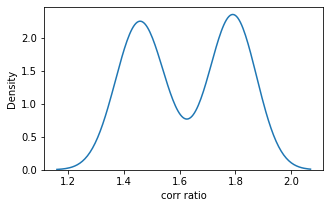

/home/mweber/tmp/FFEM x264/cluster/method-level-FAME-env/lib/python3.10/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


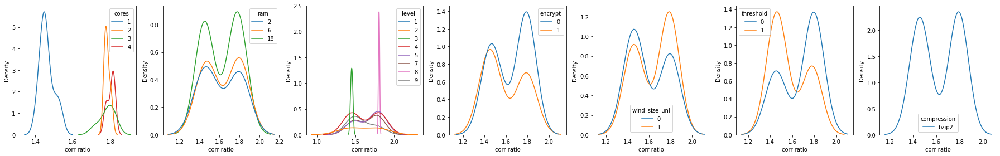

CrcUpdate


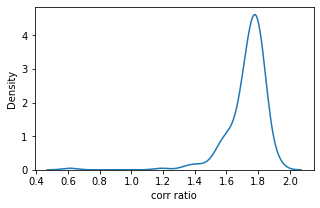

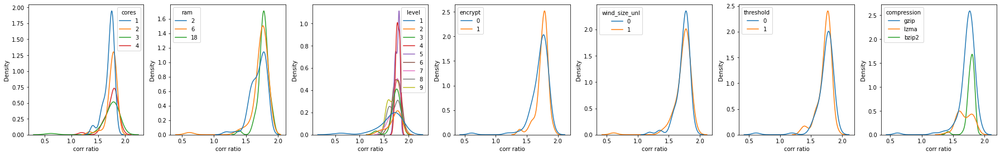

LenEnc_Encode


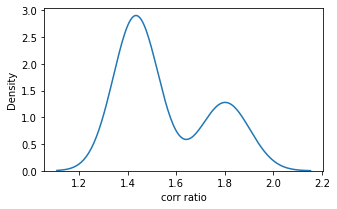

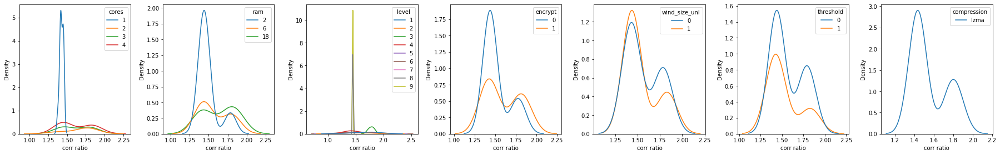

LenEnc_Encode2


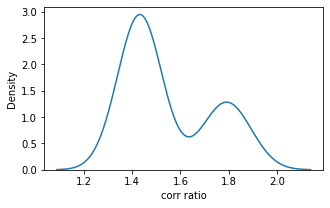

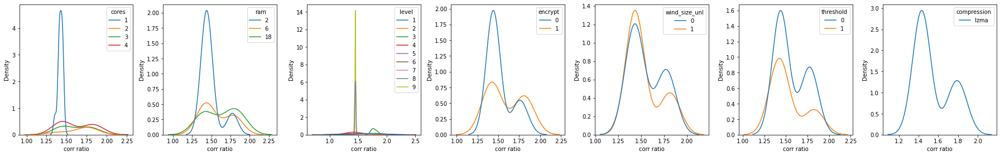

LitEnc_Encode


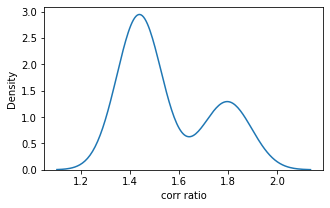

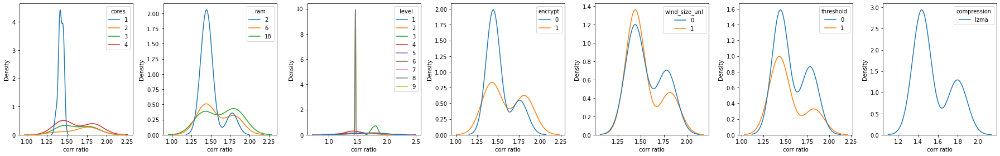

LitEnc_EncodeMatched


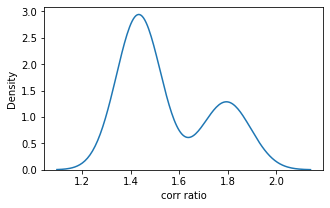

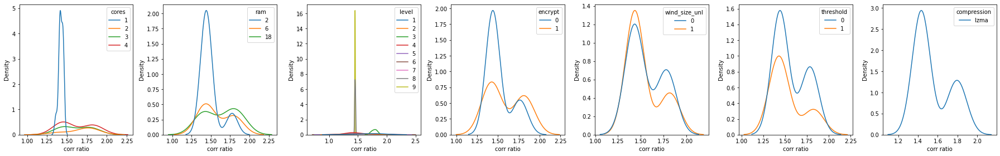

LzmaEnc_CodeOneBlock


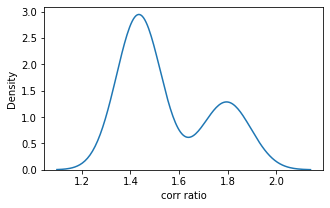

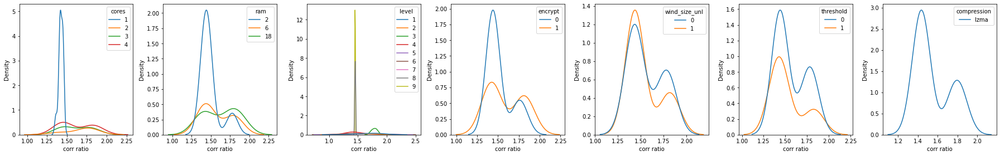

MatchFinder_GetNumAvailableBytes


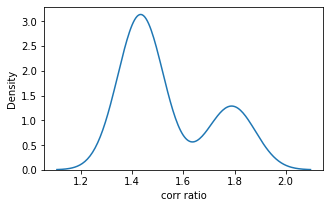

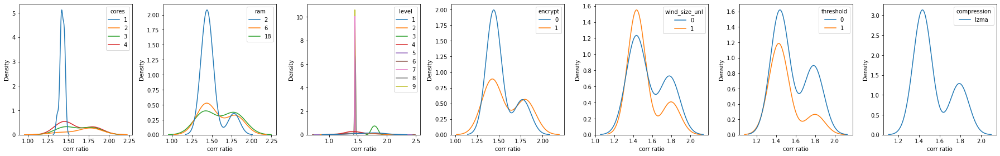

MatchFinder_GetPointerToCurrentPos


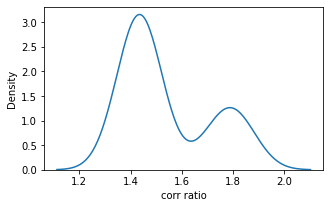

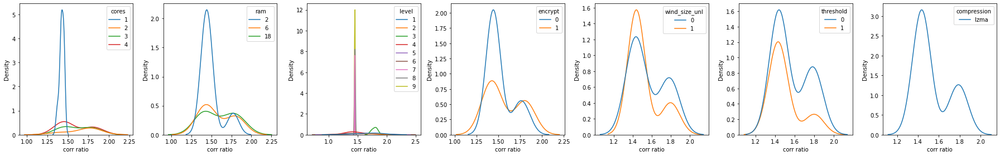

MatchFinder_Init


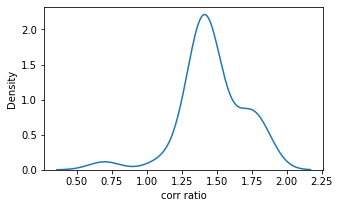

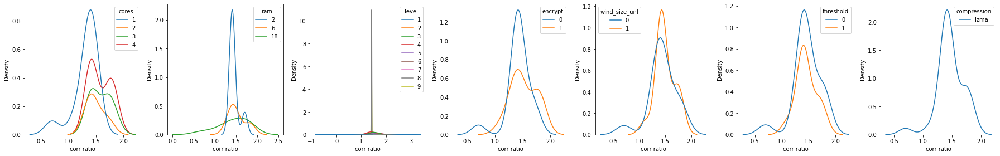

RangeEnc_EncodeBit


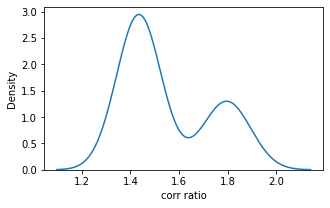

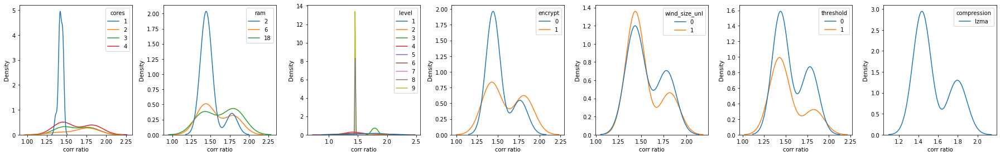

RangeEnc_EncodeDirectBits


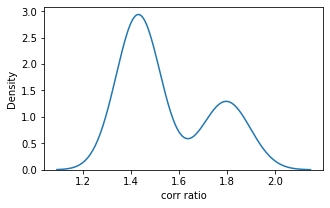

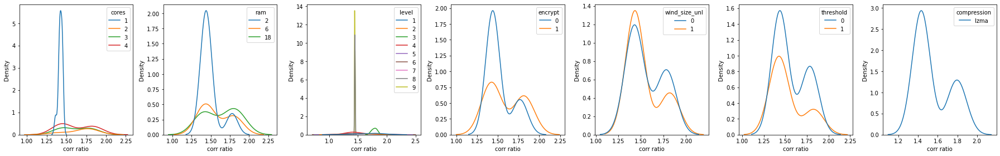

RangeEnc_ShiftLow


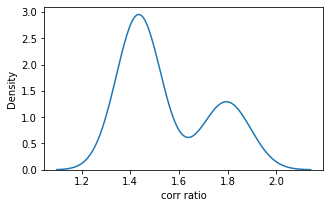

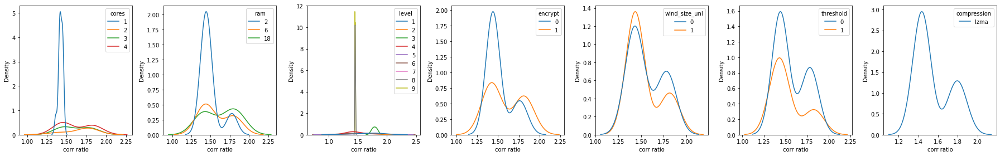

RcTree_Encode


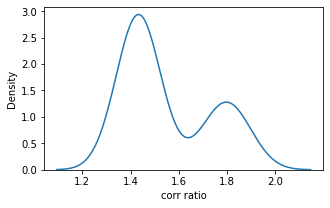

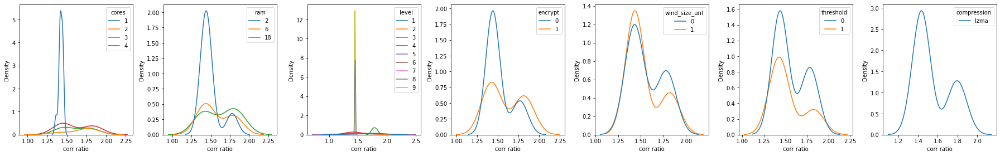

RcTree_ReverseEncode


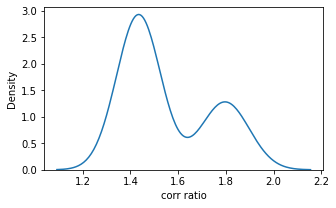

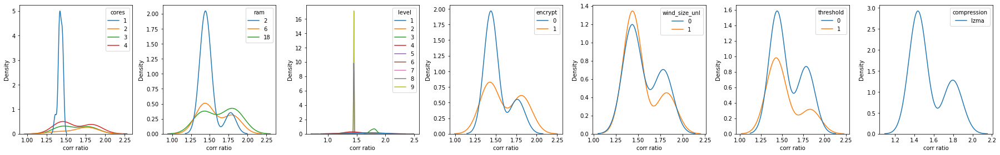

ReadMatchDistances


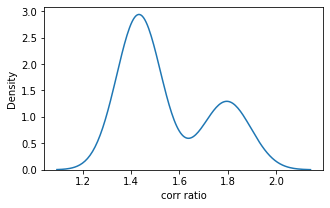

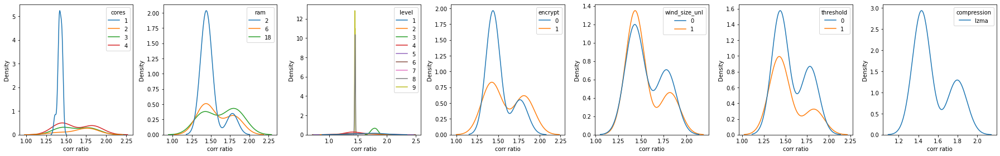

adler32_z


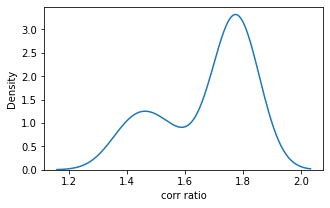

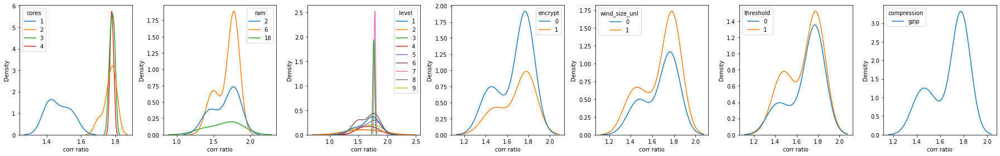

aes_crypt_cbc


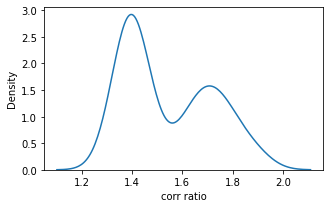

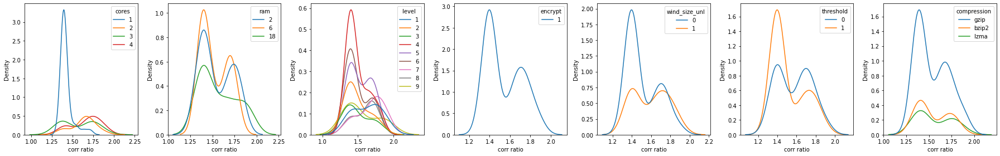

aes_crypt_ecb


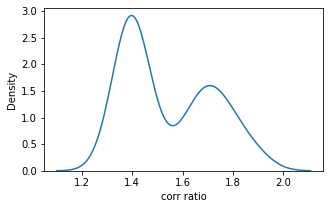

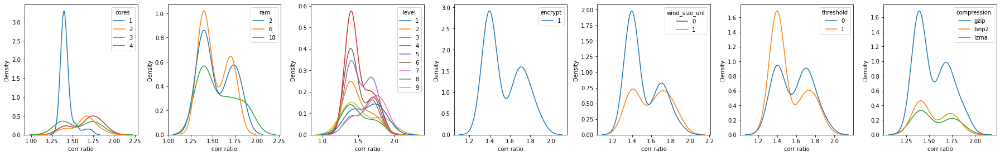

bufRead::get


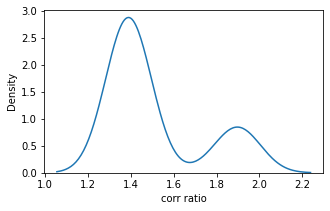

/home/mweber/tmp/FFEM x264/cluster/method-level-FAME-env/lib/python3.10/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


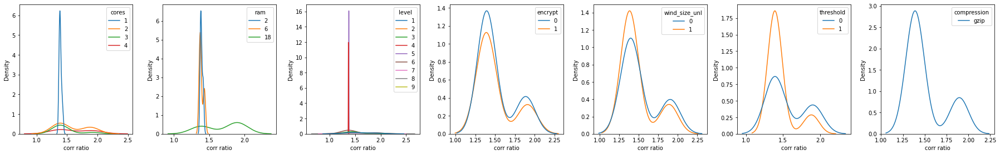

clean_one_from_hash


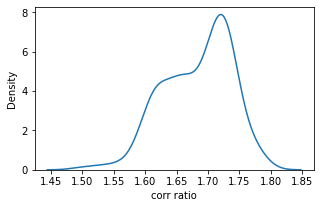

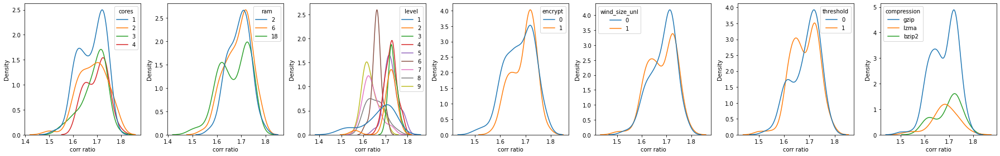

empty_hash


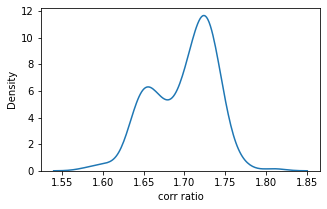

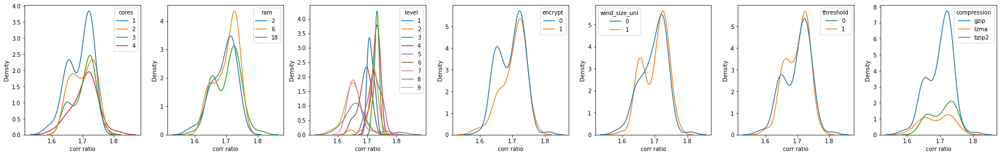

ffsll


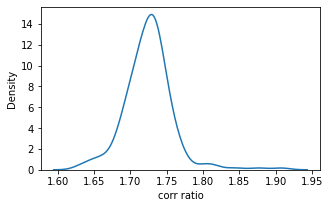

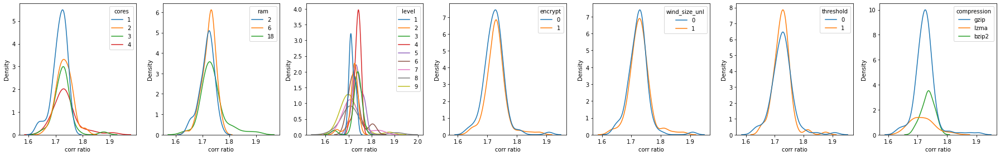

find_best_match


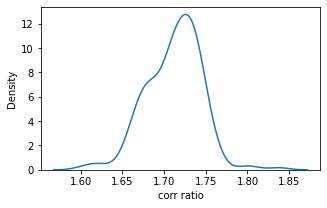

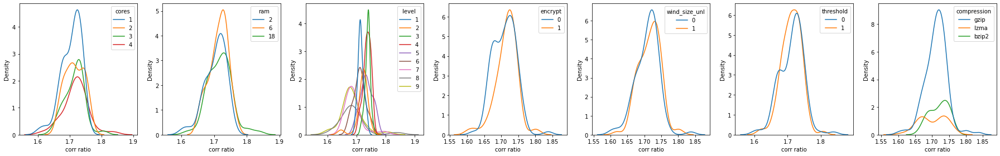

hash_search


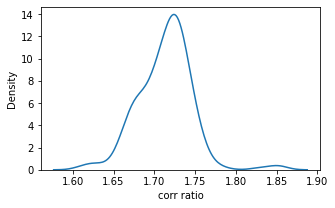

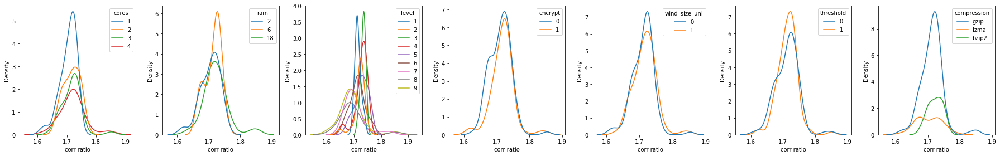

increase_mask


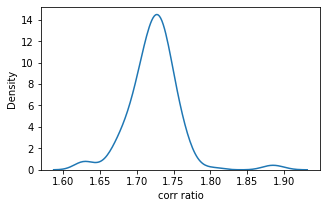

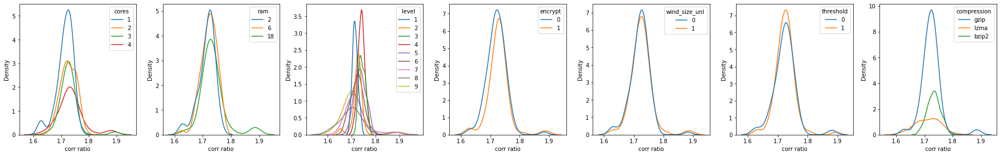

insert_hash


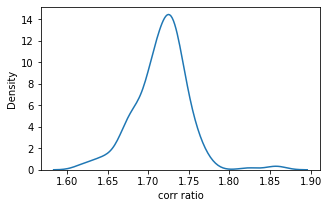

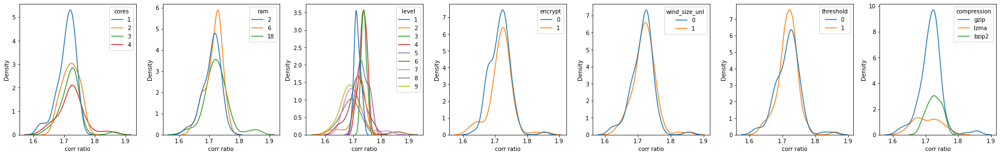

lesser_bitness


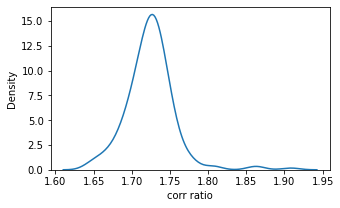

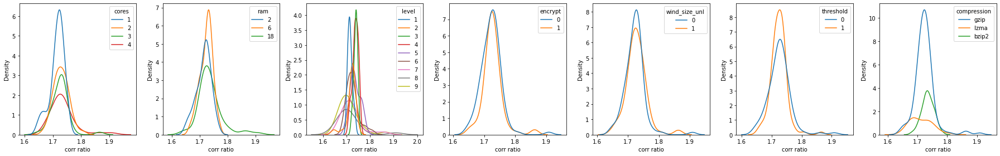

libzpaq::Encoder::compress


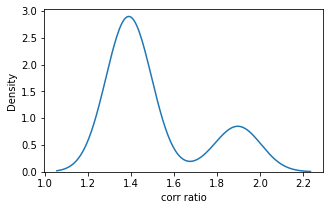

/home/mweber/tmp/FFEM x264/cluster/method-level-FAME-env/lib/python3.10/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


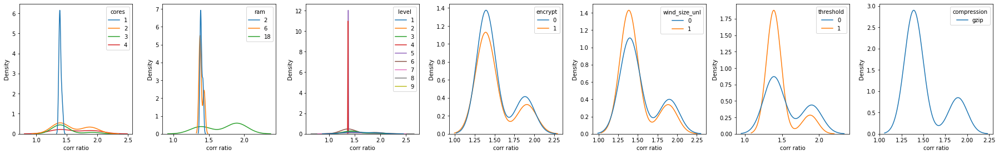

libzpaq::Encoder::encode


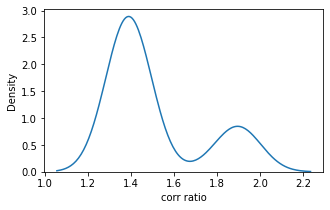

/home/mweber/tmp/FFEM x264/cluster/method-level-FAME-env/lib/python3.10/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


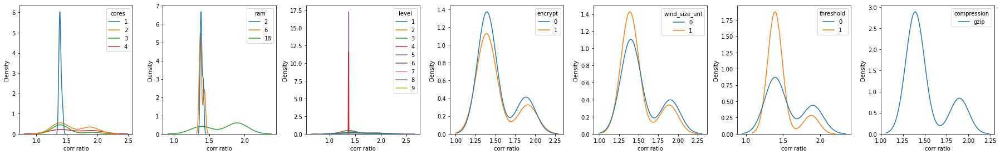

libzpaq::Predictor::predict


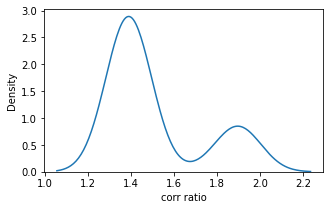

/home/mweber/tmp/FFEM x264/cluster/method-level-FAME-env/lib/python3.10/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


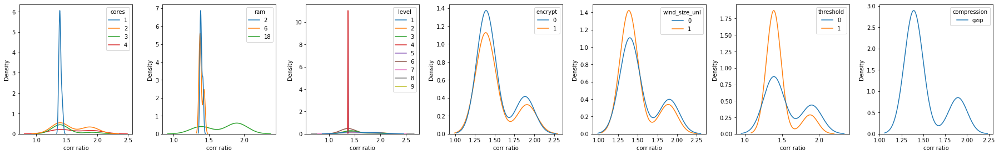

libzpaq::Predictor::update


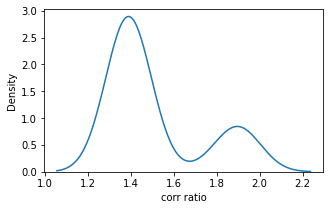

/home/mweber/tmp/FFEM x264/cluster/method-level-FAME-env/lib/python3.10/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


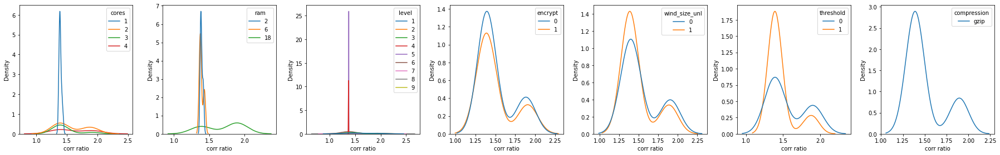

libzpaq::ZPAQL::run


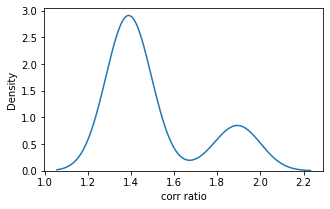

/home/mweber/tmp/FFEM x264/cluster/method-level-FAME-env/lib/python3.10/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


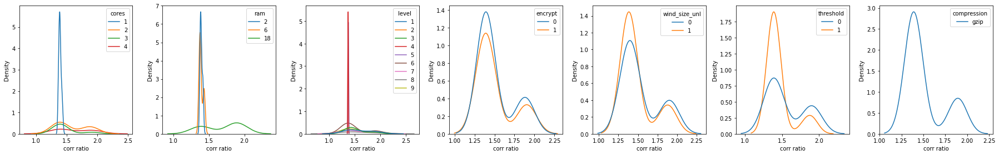

md5_process_block


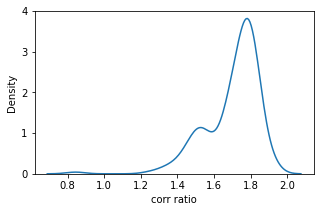

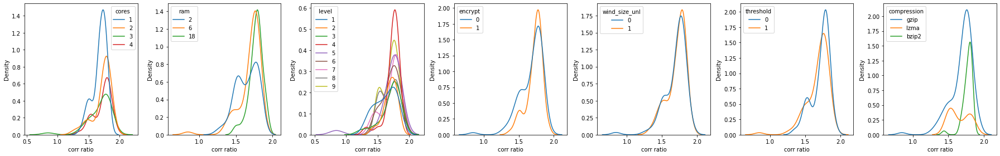

minimum_bitness


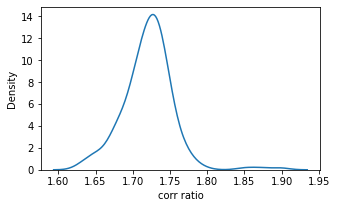

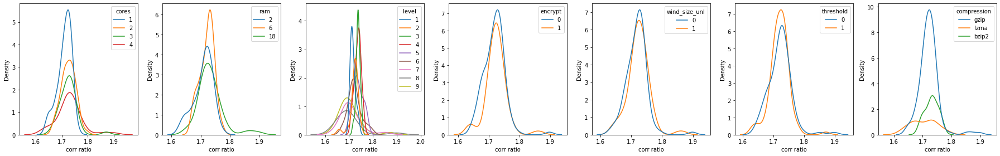

primary_hash


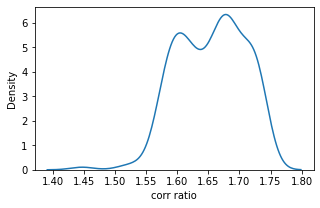

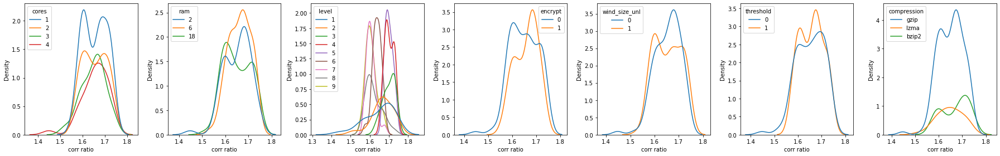

sha4_process


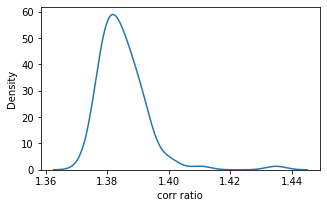

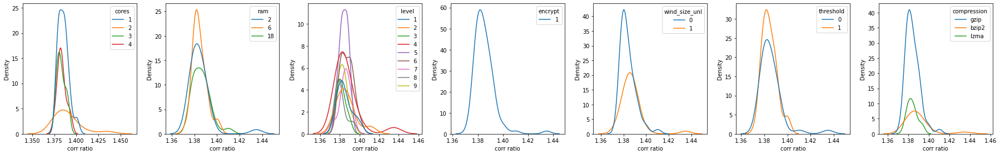

sha4_update


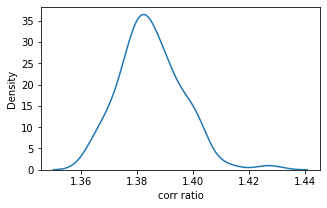

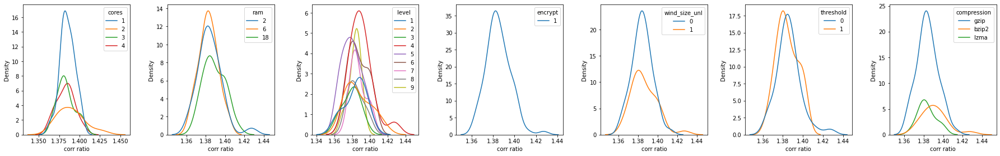

sliding_get_sb


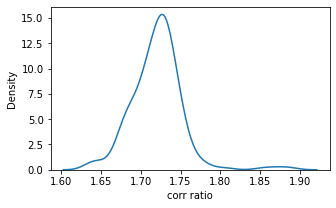

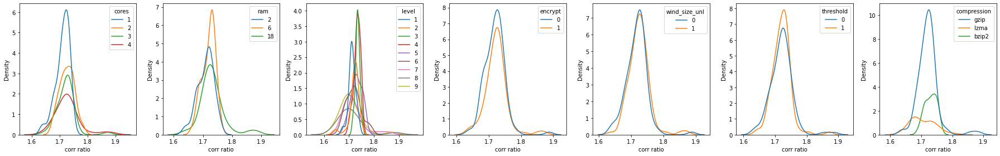

sliding_next_tag


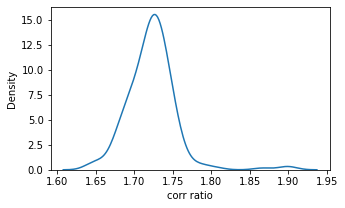

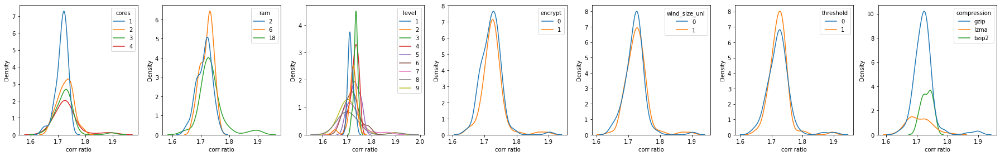

,method,num configs,modes,mode mean,mode cv
0,BZ2_blockSort,40,1,1.633281,0.098110
1,BZ2_compressBlock,40,2,1.465475,0.007039
2,BZ2_compressBlock,40,2,1.788730,0.010123
3,BZ2_hbMakeCodeLengths,40,1,1.626237,0.100063
4,CrcUpdate,183,1,1.728885,0.078184
5,LenEnc_Encode,31,2,1.447568,0.002051
6,LenEnc_Encode,31,2,1.810742,0.021778
7,LenEnc_Encode2,31,1,1.579286,0.101736
8,LitEnc_Encode,31,1,1.585344,0.100984
9,LitEnc_EncodeMatched,31,1,1.575299,0.102083


In [13]:
options = ['cores', 'ram', 'level', 'encrypt', 'wind_size_unl', 'threshold', 'compression']
methods_for_proxy_analysis = influential_methods.reset_index(drop=True)


#methods_for_proxy_analysis = df_lrzip_opt.reset_index(drop=True)
#methods_for_proxy_analysis['corr ratio'] = methods_for_proxy_analysis['energy']/methods_for_proxy_analysis['time']


print('Number all methods:', len(df_lrzip_opt.method.unique()))

proxyable_cfg_aware = []
proxyable = []


m_cnt = 0
for method, method_df in methods_for_proxy_analysis.groupby(['method']):
    if method == '[unknown]':
        continue
    print(method)
    
    plot_corr_ratio_kde_lrzip(method_df, method)
    
    global_corr_ratios = np.msort(method_df['corr ratio'].to_numpy())
    global_modes = UniDip(global_corr_ratios).run()
    
    for mode in global_modes:
        m_start, m_end = mode

        mode_mean = np.mean(global_corr_ratios[m_start:m_end])
        mode_cv = variation(global_corr_ratios[m_start:m_end])
        proxyable.append([method, len(method_df), len(global_modes), mode_mean, mode_cv])
    
    df_proxyable = pd.DataFrame(data=proxyable, columns=['method', 'num configs', 'modes', 'mode mean', 'mode cv'])
    
    
    for opt in options:
        opt_values = method_df[opt].unique()
        for opt_val in opt_values:
            sub_df = method_df.loc[method_df[opt] == opt_val]
            
            corr_ratios = np.msort(sub_df['corr ratio'].to_numpy())
            modes_of_data = UniDip(corr_ratios).run()
            
            #print(method, opt, opt_val, len(sub_df) )
            #print(modes_of_data)
            
            for mode in modes_of_data:
                m_start, m_end = mode
                
                mode_mean = np.mean(corr_ratios[m_start:m_end])
                mode_cv = variation(corr_ratios[m_start:m_end])
            
                proxyable_cfg_aware.append([method, opt, opt_val, len(sub_df), len(modes_of_data), mode_mean, mode_cv])
            

    df_proxyable_cfg_aware = pd.DataFrame(data=proxyable_cfg_aware, columns=['method', 'feature', 'value', 'num configs', 'modes', 'mode mean', 'mode cv'])
    
    m_cnt +=1
    if m_cnt > 14:
        #break
        pass

#corr_arr
df_proxyable

In [14]:
num_easy_methods = 0
easy_methods = []
for method, method_df in df_proxyable.groupby(['method']):
    if len(method_df) == 1:
        if method_df['mode cv'].values[0] < 0.05:
            num_easy_methods +=1
            easy_methods.append(method)
            #print(method, method_df['mode cv'].values[0])

print('all relevant methods:', len(df_proxyable.method.unique()))
print('energy transferable methods:', num_easy_methods)
print(easy_methods)
print()


############################### option-wise ######################################
num_multimodal_methods = 0

for method, method_df in df_proxyable_cfg_aware.groupby(['method']):
    
    if method in easy_methods:
        continue
    
    print(method, len(method_df))
    
    for feature, feature_df in method_df.groupby(['feature']):
        if len(feature_df) == 1:
            continue
            
        column = feature_df['modes']
        count = column[column > 1].count()
        if count > 0:
            #print('modes chek', feature, len(feature_df), count)
            continue
        
        column = feature_df['mode cv']
        count = column[column < 0.05].count()
        
        
        print(feature, len(feature_df), count)
        
        if count == 0:
            print(feature, len(feature_df), count)
            num_multimodal_methods += 1
            break
    
            


print()
print('all relevant methods opt:', len(df_proxyable_cfg_aware.method.unique())-num_easy_methods)
print('number multimodal methods:', num_multimodal_methods)

df_proxyable_cfg_aware

all relevant methods: 42
energy transferable methods: 14
['clean_one_from_hash', 'empty_hash', 'ffsll', 'find_best_match', 'hash_search', 'increase_mask', 'insert_hash', 'lesser_bitness', 'minimum_bitness', 'primary_hash', 'sha4_process', 'sha4_update', 'sliding_get_sb', 'sliding_next_tag']

BZ2_blockSort 23
cores 4 4
level 4 1
BZ2_compressBlock 21
cores 4 4
encrypt 2 0
encrypt 2 0
BZ2_hbMakeCodeLengths 22
cores 4 4
level 3 1
CrcUpdate 26
cores 4 0
cores 4 0
LenEnc_Encode 15
cores 2 2
level 2 2
threshold 2 0
threshold 2 0
LenEnc_Encode2 14
cores 2 1
level 2 2
threshold 2 0
threshold 2 0
LitEnc_Encode 15
cores 3 1
level 2 2
threshold 2 0
threshold 2 0
LitEnc_EncodeMatched 13
cores 2 1
encrypt 2 1
level 2 2
threshold 2 0
threshold 2 0
LzmaEnc_CodeOneBlock 14
cores 2 1
level 2 2
threshold 2 0
threshold 2 0
MatchFinder_GetNumAvailableBytes 16
encrypt 2 0
encrypt 2 0
MatchFinder_GetPointerToCurrentPos 16
cores 2 1
encrypt 2 0
encrypt 2 0
MatchFinder_Init 14
cores 2 0
cores 2 0
RangeEnc_Enco

,method,feature,value,num configs,modes,mode mean,mode cv
0,BZ2_blockSort,cores,1,20,1,1.463803,0.027878
1,BZ2_blockSort,cores,3,6,1,1.799319,0.008727
2,BZ2_blockSort,cores,4,6,1,1.788300,0.014836
3,BZ2_blockSort,cores,2,8,1,1.784986,0.002727
4,BZ2_blockSort,ram,18,17,1,1.634450,0.098880
...,...,...,...,...,...,...,...
870,sliding_next_tag,threshold,1,101,1,1.721272,0.014212
871,sliding_next_tag,threshold,0,99,1,1.720833,0.017929
872,sliding_next_tag,compression,gzip,129,1,1.721514,0.017844
873,sliding_next_tag,compression,lzma,31,1,1.705944,0.018799


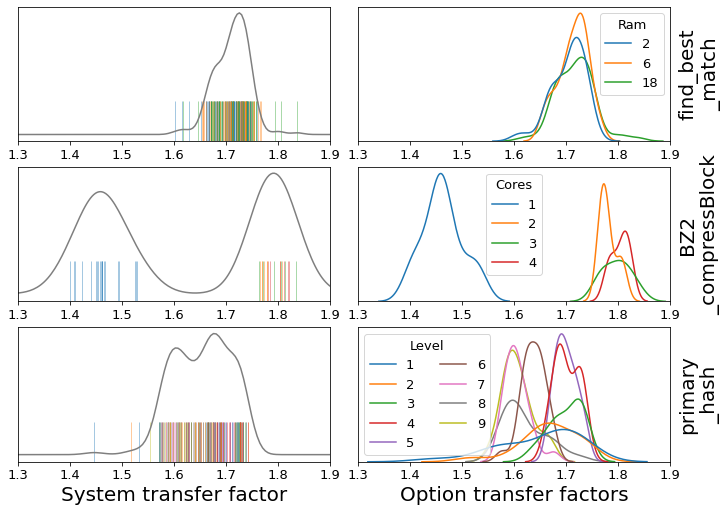

In [18]:
size = 13
plt.rc('font', size=size)

influential_methods = influential_methods.rename(columns={"corr ratio": "Energy Factor"})
methods_for_proxy_analysis = methods_for_proxy_analysis.rename(columns={"corr ratio": "Energy Factor"})

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 7), constrained_layout=True, sharex=False)


axes[2,0].set_xlabel('System transfer factor', fontsize=20)
axes[2,1].set_xlabel('Option transfer factors', fontsize=20)


sns.rugplot(data=methods_for_proxy_analysis[methods_for_proxy_analysis['method'] == 'find_best_match'], x='Energy Factor', 
            ax=axes[0,0], height=0.3, hue='ram', alpha=0.5, palette="tab10", lw=0.8, expand_margins=False)
sns.rugplot(data=methods_for_proxy_analysis[methods_for_proxy_analysis['method'] == 'BZ2_compressBlock'], x='Energy Factor', 
            ax=axes[1,0], height=0.3, hue='cores', alpha=0.5, palette="tab10", lw=0.8, expand_margins=False)
sns.rugplot(data=methods_for_proxy_analysis[methods_for_proxy_analysis['method'] == 'primary_hash'], x='Energy Factor', 
            ax=axes[2,0], height=0.3, hue='level', alpha=0.5, palette="tab10", lw=0.8, expand_margins=False)

sns.kdeplot(data=methods_for_proxy_analysis[methods_for_proxy_analysis['method'] == 'find_best_match'], x='Energy Factor', ax=axes[0,0], c=sns.color_palette('tab10')[7], bw_adjust=1, cut=27)
sns.kdeplot(data=methods_for_proxy_analysis[methods_for_proxy_analysis['method'] == 'BZ2_compressBlock'], x='Energy Factor', ax=axes[1,0], c=sns.color_palette('tab10')[7], bw_adjust=0.5)
sns.kdeplot(data=methods_for_proxy_analysis[methods_for_proxy_analysis['method'] == 'primary_hash'], x='Energy Factor', ax=axes[2,0], c=sns.color_palette('tab10')[7], bw_adjust=1, cut=20)

axes[0,0].get_legend().remove()
axes[1,0].get_legend().remove()
axes[2,0].get_legend().remove()

axes[0,0].set_yticks([])
axes[1,0].set_yticks([])
axes[2,0].set_yticks([])

axes[0,0].set_ylabel('')
axes[1,0].set_ylabel('')
axes[2,0].set_ylabel('')
axes[0,0].set_xlabel('')
axes[1,0].set_xlabel('')

g1 = sns.kdeplot(data=methods_for_proxy_analysis[methods_for_proxy_analysis['method'] == 'find_best_match'], x='Energy Factor', palette="tab10", hue='ram', ax=axes[0,1])
g2 = sns.kdeplot(data=methods_for_proxy_analysis[methods_for_proxy_analysis['method'] == 'BZ2_compressBlock'], x='Energy Factor', palette="tab10", hue='cores', ax=axes[1,1])
g3 = sns.kdeplot(data=methods_for_proxy_analysis[methods_for_proxy_analysis['method'] == 'primary_hash'], x='Energy Factor', palette="tab10", hue='level', ax=axes[2,1])

axes[0,1].set_yticks([])
axes[1,1].set_yticks([])
axes[2,1].set_yticks([])

axes[0,1].set_xlabel('')
axes[1,1].set_xlabel('')

axes[0,1].yaxis.set_label_position("right")
axes[0,1].yaxis.tick_right()
axes[0,1].set_ylabel('find_best\n_match', labelpad=8, fontsize=20)

axes[1,1].yaxis.set_label_position("right")
axes[1,1].yaxis.tick_right()
axes[1,1].set_ylabel('BZ2\n_compressBlock', labelpad=8, fontsize=20)

axes[2,1].yaxis.set_label_position("right")
axes[2,1].yaxis.tick_right()
axes[2,1].set_ylabel('primary\n_hash', labelpad=8, fontsize=20)

g1.legend_.set_title("Ram")
g2.legend_.set_title("Cores")
g3.legend_.set_title("Level")


for i in [0,1]:
    for j in [0,1,2]:
        axes[j,i].set_xlim(1.3, 1.9)


dump_lines = axes[2,1].lines
axes[2,1].legend(reversed(dump_lines), reversed(['9','8','7','6','5','4','3','2','1']), ncol=2)
g3.legend_.set_title("Level")


plt.savefig('./../../RQ3/overview_small.pdf')
plt.savefig('./../../RQ3/overview_small.png', dpi=200)
plt.show()
